# **ASSIGNMENT 1: BASIC IMAGE PROCESSING**
------------------------------------------
Student Name: Varshitha Venkatesh

A\#: A00459824

e-mail: Varshitha.Venkatesh@smu.ca

-----------------------------------------

This is your first project of the computer vision course. In this project, you will learn the basics of image processing functions using OpenCV and/or scikit image libraries and python. First few activities are designed for you to get familiar with basic i/o and processing utilities for images, e.g., image load, save, print the image data, drawing on images, image tramsofmrtaions, image padding etc. Please have the OpenCV Python tutorial (https://docs.opencv.org/4.x/d3/df2/tutorial_py_basic_ops.html) open in a browser tab and ready for your reference.

**Agenda for Recitations 1 and 2**


*   Learn to use OpenCV functions for basic image processing tasks
*   Apply image filtering operations
*   Create a hybrid image using high and low pass filters (see the teaser below)
*   Learn to use edge detection filters

There are **seven graded activities** in this assignment. Your task is to complete the code by providing appropriate content for any blank lines or missing sections indicated in the given code snippets. Please fill in these gaps with suitable code that maintains the logic and functionality of the overall program. You may use the hints given in the text or comments.

**Due date:** *Please include your last name in the .ipynb file and submit the renamed file to Teams by* **September 25.** *For instance, a student with the last name 'abc' would rename their file to Hybrid_images_activities_abc.ipynb.*




![Teaser](https://drive.google.com/uc?export=vies&id=1gCSwHuLvT_qUpGHjmCVoDRhAzpGTFFad)


#**1. Getting Started**
We will use Google colab through out this course. Google colab is basically a free Jupyter notebook environment running completely in the cloud. Colab does not require a setup and it supports most popular machine learning libraries which can be easily loaded in your notebook.

To use colab, each one of you needs to have an account with Google. Those who have a Google account, you can use it to sign into colab. Those who don't have a Google account, please sign up for one, see https://accounts.google.com/signup/v2/webcreateaccount?continue=https%3A%2F%2Fmyaccount.google.com%3Futm_source%3Daccount-marketing-page%26utm_medium%3Dcreate-account-button&flowName=GlifWebSignIn&flowEntry=SignUp .

We will use Google drive to store your projects. Download the project from MS Teams into the `My Drive/Colab Notebooks` of your google drive.

*italicized text*# **2. Basics**

First, let us mount the google drive and set the working directory to 'My Drive/Colab Notebooks/Hybrid_Images'.

In [1]:
import os
from google.colab import drive
drive.mount('/content/gdrive/', force_remount=True)
root_dir = "/content/gdrive/MyDrive/"
project_folder = "Colab Notebooks/Hybrid_Images/"
os.chdir(root_dir+project_folder)

Mounted at /content/gdrive/


Let us import relevant packages and modules. The first requirement is to import the OpenCV module.

In [2]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from skimage.util import random_noise
import time

Read and display an image. I have used OpenCV functions here. You may try skimage.io.imread function (https://scikit-image.org/docs/dev/api/skimage.io.html?highlight=imread#skimage.io.imread).

We can read the image using imread module. It takes 2 arguments:
**path**: A string representing the path of the image to be read.
**flag**: It specifies the way in which image should be read. The default value is cv2.IMREAD_COLOR

There are 3 possible values of flag as shown below:
1.   cv2.IMREAD_COLOR: It specifies to load a color image. Any transparency of image will be neglected. It is the default flag. Alternatively, we can pass integer value 1 for this flag.
2.   cv2.IMREAD_GRAYSCALE: It specifies to load an image in grayscale mode. Alternatively, we can pass integer value 0 for this flag.
3. cv2.IMREAD_UNCHANGED: It specifies to load an image as such including alpha channel. Alternatively, we can pass integer value -1 for this flag.

Since I'm using a colored image, I'll use 1. We will load `lenna.bmp` which is one of the classic test images of computer vision field. You can find the `lenna.bmp` in the `data` folder of the `Hybrid_Images` project folder.


In [3]:
img = cv2.imread("./data/lenna.bmp", 1)


In [4]:
print(os.getcwd()) # Troubleshooting - get current working directory

/content/gdrive/MyDrive/Colab Notebooks/Hybrid_Images


In [5]:
import os
print(os.path.exists("./data/lenna.bmp")) # Troubleshooting - test if path exists

True


An image can be conceptualized as a two-dimensional grid composed of cells, where each cell, known as a pixel, possesses an intensity value. In the case of a color image, each pixel contains multiple color channels. For instance, RGB images have three values for each pixel, representing the red, green, and blue channels, as illustrated in the following figure.

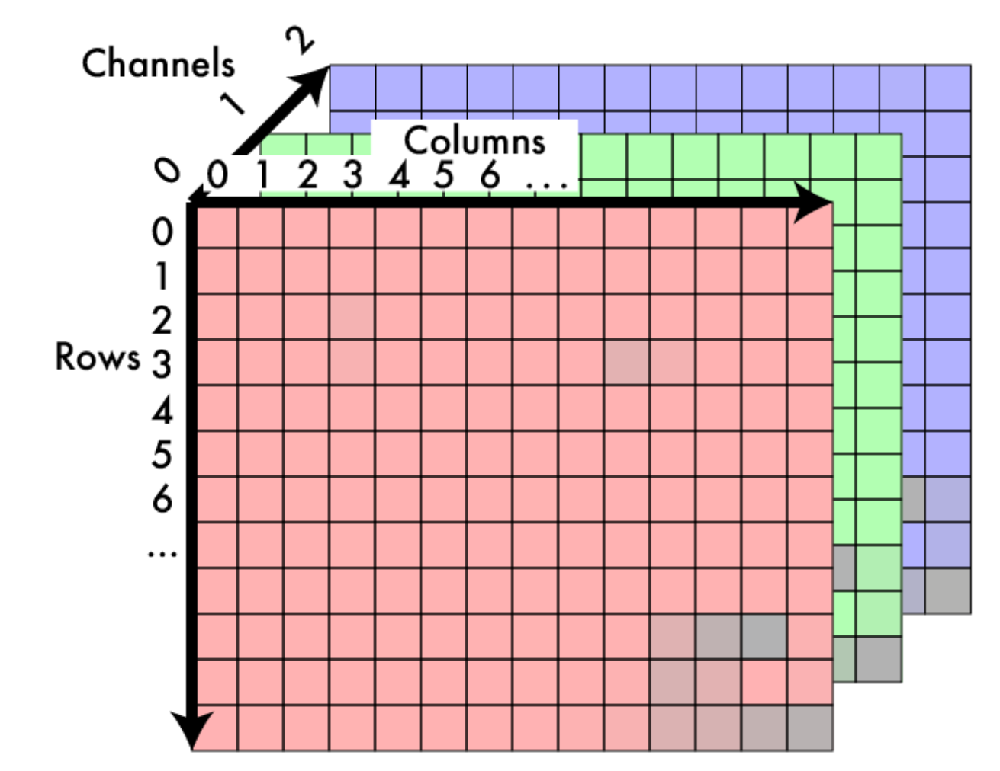

For displaying an image, OpenCV provides imshow() function. However, the imshow method is disabled in Google Colab. Thus, colab users need to import cv2_imshow for displaying images. cv2_imshow() can be imported from google.colab.patches.

Now, just displaying the image often leads to crashing.

**The Problem** The Notebook it is not usually happy to accommodate the window created by imshow. So it just crashes the window.

**The Solution** To solve this, you need to explicitly close the window when you are done with it. To accomplish this, you can use the cv2.destroyAllWindows() functionality.

Since you probably don’t want your screen to close immediately, you can tell OpenCV to wait for a keypress.

waitKey(0) will display the window infinitely until any keypress (it is suitable for image display).

waitKey(1) will display a frame for 1 ms, after which display will be automatically closed. If you specify 25 inside the brackets, it will display for 25ms.

Finally, we use destroyAllWindows to close the window based on the waitForKey parameter.

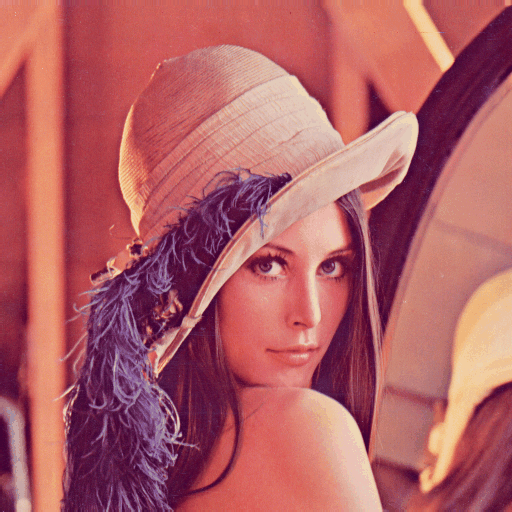

In [6]:
from google.colab.patches import cv2_imshow
cv2_imshow(img)

# waiting for key event
cv2.waitKey(0)

# destroying all windows
cv2.destroyAllWindows()

Let us find some details about the Lenna image.

By shape of the image, we mean the shape of the NumPy array. As you see from executing the code, the matrix consists of 512 rows and 512 columns.

The last value 3 indicates the no. of channels. It is

1. 3 = coloured image
2. 1 = black and white/grayscale image

Executing the below code, you can find that the image is a numpy array, the data type is unsigned int. The size of the image is 786432 (512x512x3). Finally, the array values are printed.

In [7]:
print(img.shape)
print(type(img))
print(img.dtype)
print(img.size)
print(img)

(512, 512, 3)
<class 'numpy.ndarray'>
uint8
786432
[[[121 133 222]
  [121 133 222]
  [129 137 226]
  ...
  [121 145 226]
  [105 121 218]
  [ 89  93 198]]

 [[121 133 222]
  [121 133 222]
  [129 137 226]
  ...
  [121 145 226]
  [105 121 218]
  [ 89  93 198]]

 [[121 133 222]
  [121 133 222]
  [129 137 226]
  ...
  [121 145 226]
  [105 121 218]
  [ 89  93 198]]

 ...

 [[ 56  16  80]
  [ 56  16  80]
  [ 52  20  89]
  ...
  [ 80  64 170]
  [ 72  64 174]
  [ 72  56 170]]

 [[ 56  16  80]
  [ 56  16  80]
  [ 64  24  93]
  ...
  [ 76  68 178]
  [ 76  68 178]
  [ 76  68 182]]

 [[ 56  16  80]
  [ 56  16  80]
  [ 64  24  93]
  ...
  [ 76  68 178]
  [ 76  68 178]
  [ 76  68 182]]]


To access a pixel value. It shows the RGB values. By OpenCV convention, the first value corresponds to B, the second to G and the third corresponds to R, i.e., OpenCV reads RGB as BGR.

In [8]:
pixel = img[25, 100]
print(pixel)

[ 76  68 178]


OpenCV provides imwrite() function to save an image. After executing the below code, you may verify the saved image under your 'results' folder.

In [9]:

cv2.imwrite("./results/lenna_color.bmp", img)


True

**Copying** an image.

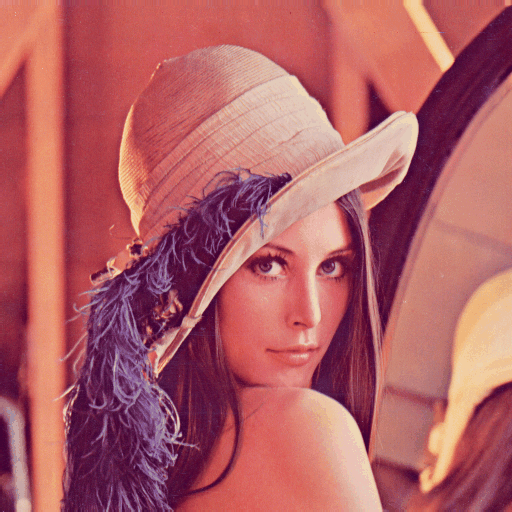

-1

In [10]:
img_copy = img.copy()
cv2_imshow(img_copy)
cv2.waitKey(0)

## **2.1 Geometric Primitives**
Next, let use use some drawing functions to draw geimetric primtives (line, circle etc.) on an image.

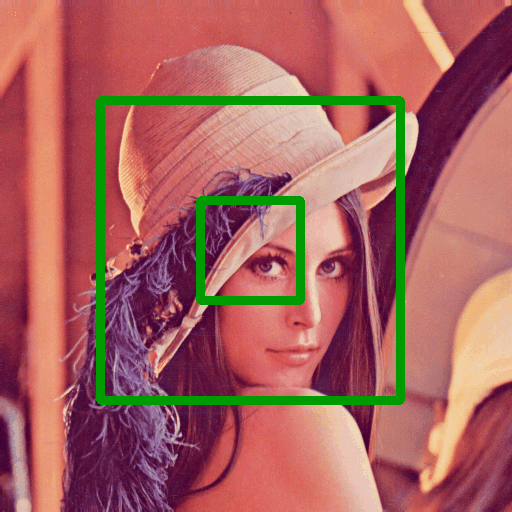

'blue = (255, 0, 0)\nthickness = 8\nimg_line = cv2.line(img, (0,0), (512, 512), blue, thickness)\ncv2_imshow(img_line)\n\n\n#Circle\nred = (0, 0, 255)\nimg_circle = cv2.circle(img, (256,256), 100, red, thickness)\ncv2_imshow(img_circle)'

In [11]:
#rectangle
img1=img
green = (0, 155, 0)
thickness = 8
img_rect = cv2.rectangle(img1, (100, 100), (400, 400), green, thickness)
img_rect = cv2.rectangle(img_rect, (200,200), (300, 300), green, thickness)
cv2_imshow(img_rect)

#Line
'''blue = (255, 0, 0)
thickness = 8
img_line = cv2.line(img, (0,0), (512, 512), blue, thickness)
cv2_imshow(img_line)


#Circle
red = (0, 0, 255)
img_circle = cv2.circle(img, (256,256), 100, red, thickness)
cv2_imshow(img_circle)'''

## **2.2 Color Space Conversions**
Color space conversions are often necessary for various computer vison tasks. There are several color spaces available in OpenCV, e.g., RGB, LAB or HSV. Note that OpenCV RGB color specification follows blue, green and red order, i.e., if you provide values (20, 102, 200), the value 20 is mapped to blue, not the red. Let us do some color conversions. The image lenna.bmp is a color image. we will first convert it to a gray scale image, then to an HSV image and YUV image.

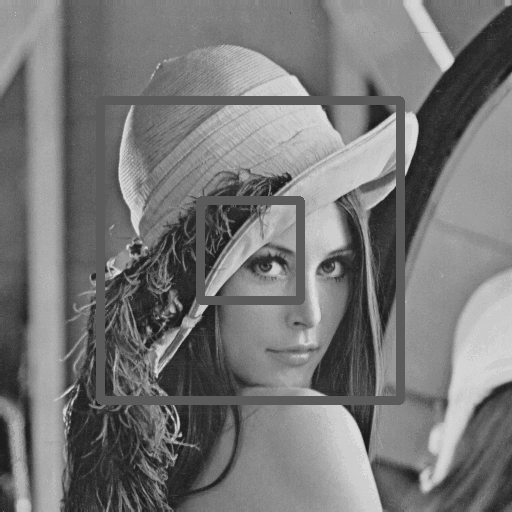

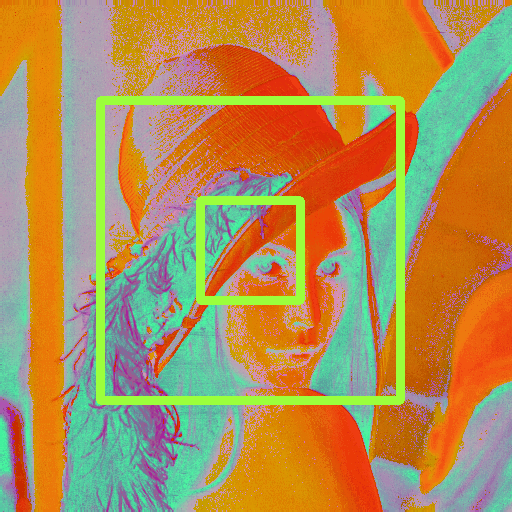

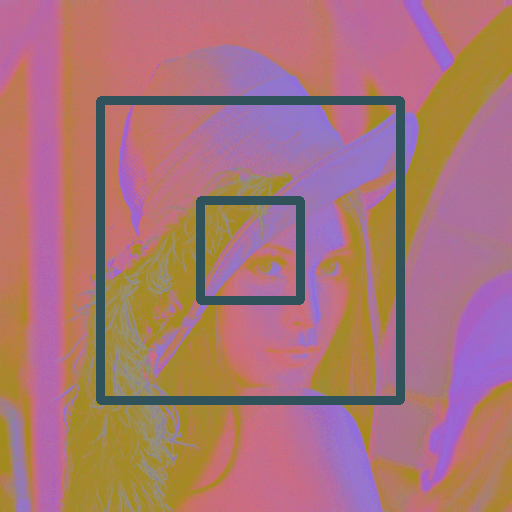

-1

In [12]:
#RGB (BGR) to gray
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray)
cv2.waitKey(15)

#BGR to HSV
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
cv2_imshow(hsv)
cv2.waitKey(15)

#BGR to YUV
yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)
cv2_imshow(yuv)
cv2.waitKey(15)

## **2.3 Affine Transformations**
Image transformations (affine) such as rotations, scaling and translation play an important part of many computer vison algorithms.

An **affine transformation** is one that can be expressed in the form of a matrix multiplication (linear transformation) followed by a vector addition (translation). So let us do a couple of activities to learn the OpenCV functions for image transformation.

**Image Translation:**



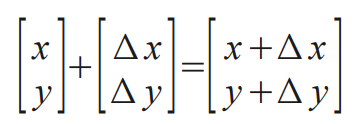

We can express this operation in terms of matrix multiplication as follows:

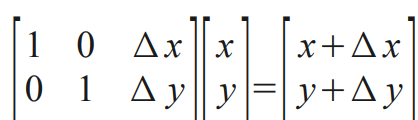

In the above equation, the first matrix is the translation matrix (T), the second column vector represents the pixel (or point) to be translated and the last column vector represents the translated pixel. In the following code, we first compose the translation matrix T and use the  [cv2.warpAffine()](https://docs.opencv.org/4.x/da/d54/group__imgproc__transform.html#ga0203d9ee5fcd28d40dbc4a1ea4451983) function to translate the ```image```.

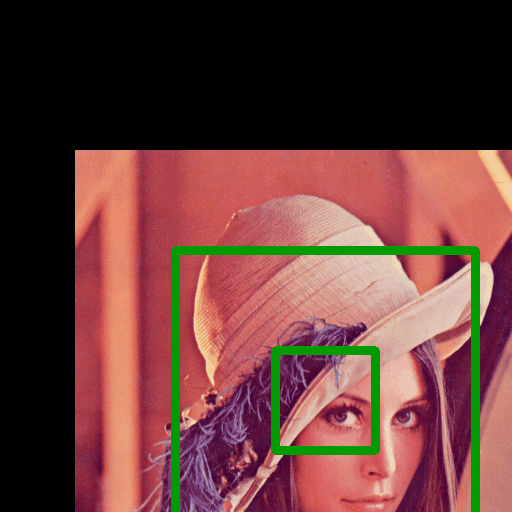

In [13]:
#Image Translation

rows,cols = img.shape[:2] #get shape in terms of pixels
T = np.float32([[1, 0, 75],
                [0, 1, 150]])
trans_img = cv2.warpAffine(img,T,(cols,rows))
cv2_imshow(trans_img)


**Image rotation:**

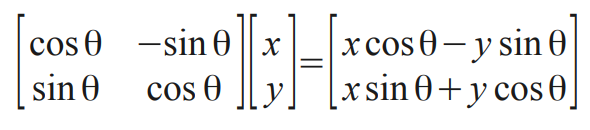

The above equation presents the rotation of a pixel (or point) ```(x, y)```  by an angle  ```theta```  with respect to the origin. In The following code snippet, we use ```cv2.getRotationMatrix2D()``` function to construct the rotation matrix (R). the function takes the center with respect to which the image will rotate, the angle by which the image to be rotated and an optional scale factor.

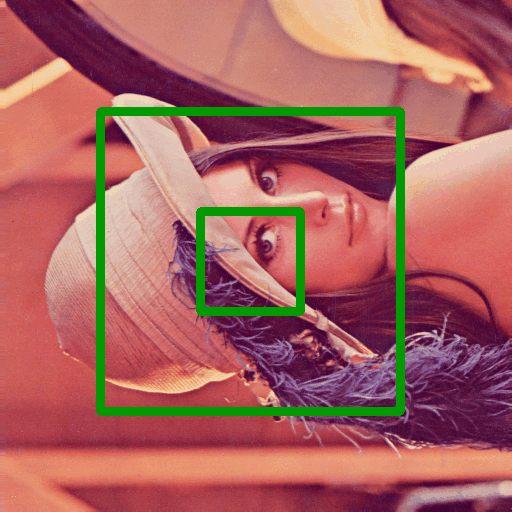

In [14]:
#Image Rotation
R = cv2.getRotationMatrix2D(((cols-1) / 2.0, (rows-1) / 2.0), 90, 1)
rot_img = cv2.warpAffine(img, R, (cols, rows))
cv2_imshow(rot_img)


A simple python function to create an image grid is given below. The function takes n images and returns a larger image grid containing n images arranged in an n/m x m fashion. The function will be used to arrange subsequent image processing results in a grid. You may skip this code as it does not deal with any image processing task.

In [15]:
import math
import matplotlib.pyplot as plt
import cv2  # Make sure to import cv2 if you're using OpenCV for image processing

def grid_image(img_list, cols):
    # Get number of images
    length = len(img_list)

    # Calculate number of rows needed for the grid
    rows = math.ceil(length / cols)

    # Create a new figure of size 12 x 12 inches
    fig = plt.figure(figsize=(12, 12))

    # Outer loop iterates over rows
    for i in range(rows):
        # Inner loop iterates over columns
        for j in range(cols):
            # Calculate the index of the image
            index = i * cols + j

            # Check if the index is within the range of the image list
            if index < length:
                # Add a subplot for the current image
                ax = fig.add_subplot(rows, cols, index + 1)
                ax.imshow(cv2.cvtColor(img_list[index], cv2.COLOR_BGR2RGB))
                ax.axis('off')  # Turn off axis labels
            else:
                # If there are no more images, we can leave the cell empty
                ax = fig.add_subplot(rows, cols, index + 1)
                ax.axis('off')  # Turn off axis labels

    # Show the grid of images
    plt.tight_layout()
    plt.show()

**Image resizing (scaling)**

The process of changing the dimensions of an image, which may involve altering its width and height in pixels, potentially affecting the aspect ratio.
Image Scaling is a pecific type of resizing that adjusts an image's dimensions proportionally, maintaining its original aspect ratio without distortion. Mathematically, the scaling is expressed as follows.

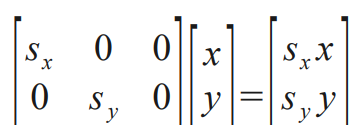

OpenCV has ```cv2.resize()``` function to perform resizing such as upscaling or downscaling. When resizing images, various interpolation schemes are used to determine the values of pixels in the resized image. Here are some common interpolation methods: nearest neighbor, bilinear and bicubic etc.  These interpolation schemes determine the quality of the output image. In the following code snippet, the scaling factors ```(s_x``` and ```s_y)```  are denoted by ```f_x``` and ```f_y```.

In [16]:
#Image resizing-try nearest neighbor, cubic, bilinear and interpolation schemes
res_nn = cv2.resize(img, None, fx=1.5, fy=1.5, interpolation = cv2.INTER_NEAREST)
res_cubic = cv2.resize(img, None, fx=1.5, fy=1.5, interpolation = cv2.INTER_CUBIC)
res_linear = cv2.resize(img, None, fx=.5, fy=.5, interpolation = cv2.INTER_LINEAR)
res_area = cv2.resize(img, None, fx=.5, fy=.5, interpolation = cv2.INTER_AREA)

img_list = [res_nn, res_cubic, res_linear, res_area]
grid_image(img_list,2)
#cv2_imshow(results)




Output hidden; open in https://colab.research.google.com to view.

**Image padding**

In image processing, padding refers to adding extra pixels around the image for maintaining aspect ratio (used when resizing images to fit specific dimensions), preparing images for algorithms (some image processing or machine learning algorithms require input images of specific sizes) and creating borders. OpenCV provides cv2.copyMakeBorder() function with different border options such as replicate, reflect etc. Please run the code below and understand different border options.

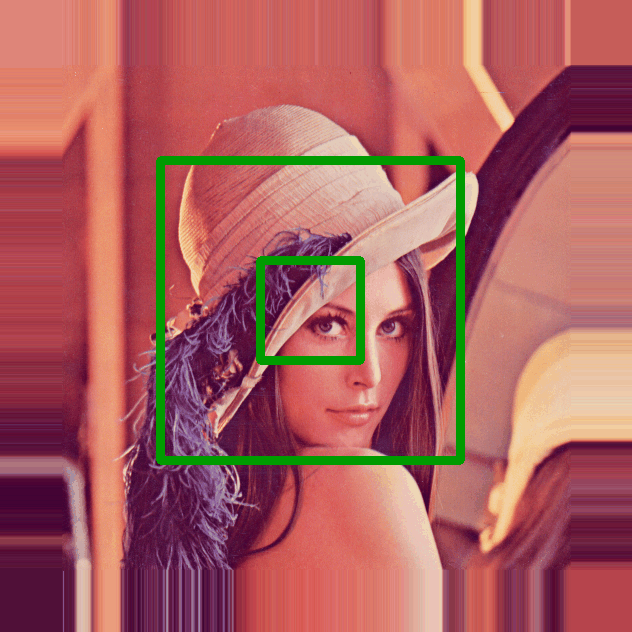

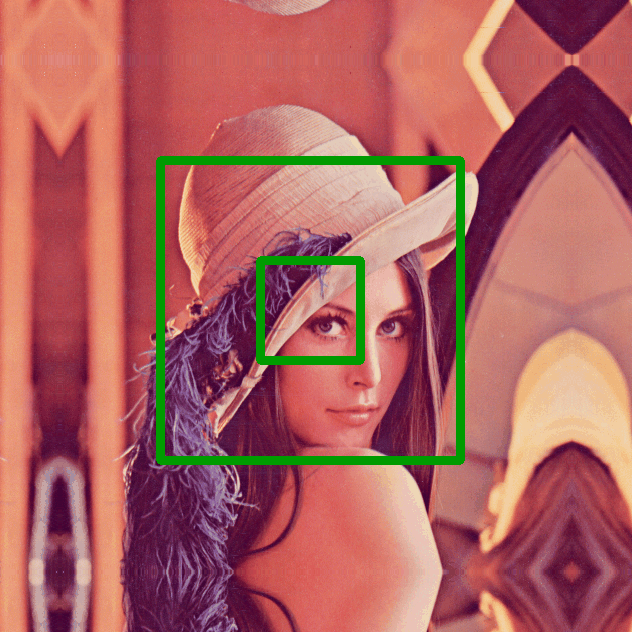

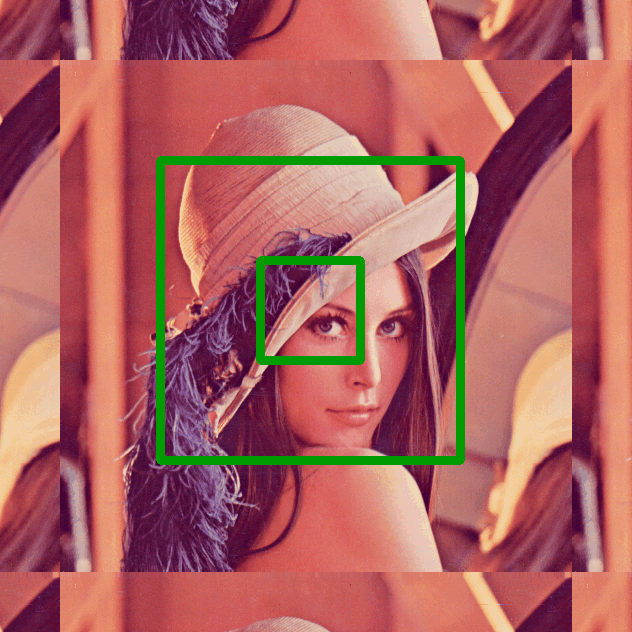

In [17]:
replicate = cv2.copyMakeBorder(img,60,60,60,60,cv2.BORDER_REPLICATE)
reflect = cv2.copyMakeBorder(img,60,60,60,60,cv2.BORDER_REFLECT)
wrap = cv2.copyMakeBorder(img,60,60,60,60,cv2.BORDER_WRAP)

cv2_imshow( replicate)
cv2_imshow( reflect)
cv2_imshow( wrap)

# **3. Image Filtering (Spatial)**

In this section, you will learn how to design and apply image filters. We will start with the implementation of convolution operation. We have provided a skeleton code of the function below. Your task is to fill in the required code to get that function working as intended.

In image processing, **Convolution** is the process of transforming an image by applying a kernel over each pixel and its local neighbors across the entire image. The **kernel** is a matrix of values whose size and values determine the transformation effect of the convolution process. Typical size of the kernel is 3 x 3, but other sizes (e.g., 5 x 5, 10 x 10) are also used.

Three main steps of convolution are the following.  

1.   The algorithm places the Kernel Matrix (h(x, y)) over each pixel of the image (f(x, y)) (ensuring that the full Kernel is within the image), multiplies each value of the Kernel with the corresponding pixel it is over.
2.   Then, sums the resulting multiplied values and returns the resulting value as the new value of the center pixel.
3. This process is repeated across the entire image to get the new image (g(x,y)). See the illustration below.

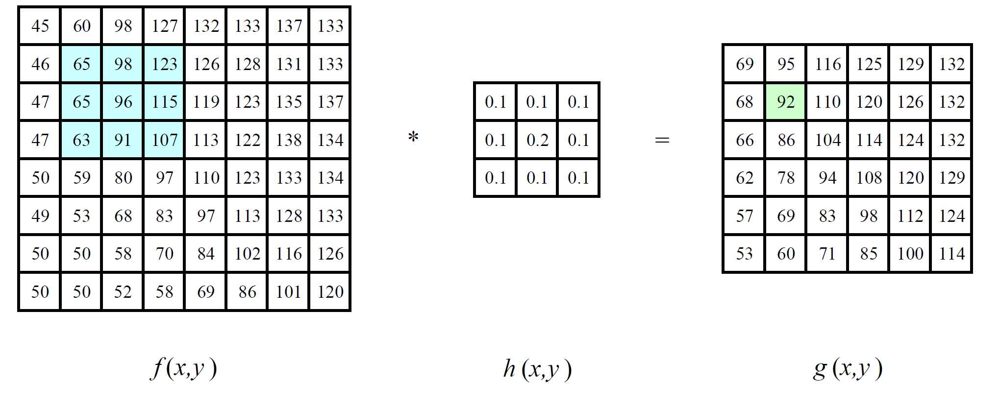

## **3.1 Write a convolution function (30%)**
The following function takes as input an image and a kernel, convolve the image with kernel and returns the convolved image. The function first extracts the sizes of the image and kernel. Inorder to ensure that the kernel is placed within the image, we use pad_h and pad_w. Three loops are used to iterate over the height, width and the color channels of the image. Your task is to define the sub-region in the image called 'center' on which the kernel will be convolved in each iteration the loops. Then perform the multiplication of the pixel values, add the values and write the result as the new value of the center pixel.


Note that the output of the convolution process changes with the kernel size and values. We will see some examples in the subsequent activties.


In [18]:
#Graded Activity 1

def convolution(image: np.array, kernel: np.array) -> np.array:
    # Flip the kernel to prepare for convolution (this is a standard step in convolution).
    kernel = cv2.flip(kernel, -1)

    # Get the height and width of the image. The third value of shape is the color channel.
    (image_h, image_w) = image.shape[:2]  # image_h: height, image_w: width # ANS
    (kernel_h, kernel_w) = kernel.shape[:2]  # kernel_h: height, kernel_w: width # ANS

    # Calculate the padding needed for the image based on the kernel size.
    (pad_h, pad_w) = (kernel_h // 2, kernel_w // 2)

    # Create an output image initialized to zeros, with the same shape as the input image.
    output = np.zeros((image_h, image_w, 3), dtype=np.uint8) # ANS

    # Slide the kernel across every pixel in the image, excluding the padding area.
    for y in range(pad_h, image_h - pad_h):
        for x in range(pad_w, image_w - pad_w):
            # Iterate over each color channel (assuming the image is in BGR format).
            for colour in range(image.shape[2]):
                # Extract the region of the image that corresponds to the current position of the kernel.
                center = ((kernel_h - 1) / 2.0, (kernel_w - 1) / 2.0, 3) # ANS

                # Perform the convolution operation by element-wise multiplication and summation.
                # This computes the weighted sum of the surrounding pixels as defined by the kernel.
                output[y, x, colour] = (center * kernel).sum()

    # Return the result of the convolution operation as the output image.
    return output

Now let us use convolution to do some image filtering. We have to define the kernel matrix first as shown below. The kernel that we use below is a high-pass filter which allow only high frequency signals. Normally high frequency signals are found along the edges and hence you can see the edges in the filtered image.

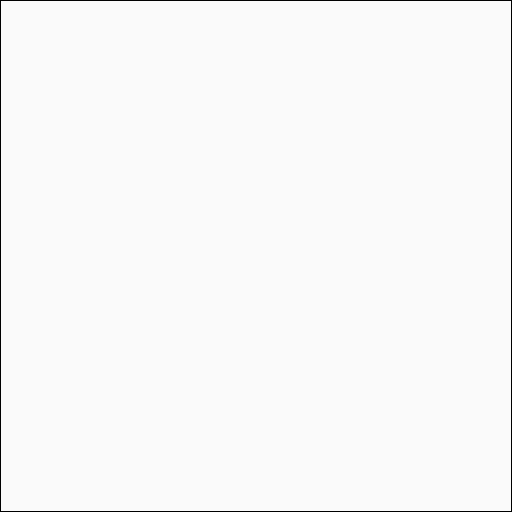

In [19]:
kernel = np.array([
    [-1, -1, -1],
    [-1,  8, -1],
    [-1, -1, -1]
])

res_image = convolution(img, kernel)
cv2_imshow(res_image)



OpenCV provides a convolution function called 'filter2D()'. Perform the convolution using OpenCV filter2D.

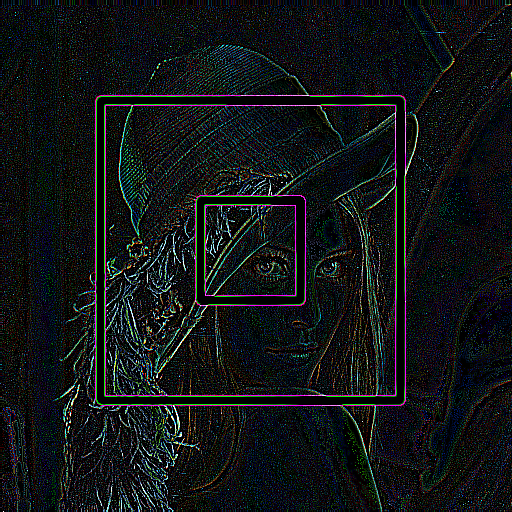

In [20]:
#openCV filter2D
cvres_image = cv2.filter2D(img,-1, kernel)
cv2_imshow(cvres_image)


## **3.2 Create your own box filter (10%)**


Your next task is to create an average/mean/box filter. This is a smoothing kernel (or filter) which reduces the amount of intensity variation between one pixel and the next. The idea of mean filter is to replace each pixel value in an image with the mean (`average') value of its neighbors, including itself. A box filter looks like the following.

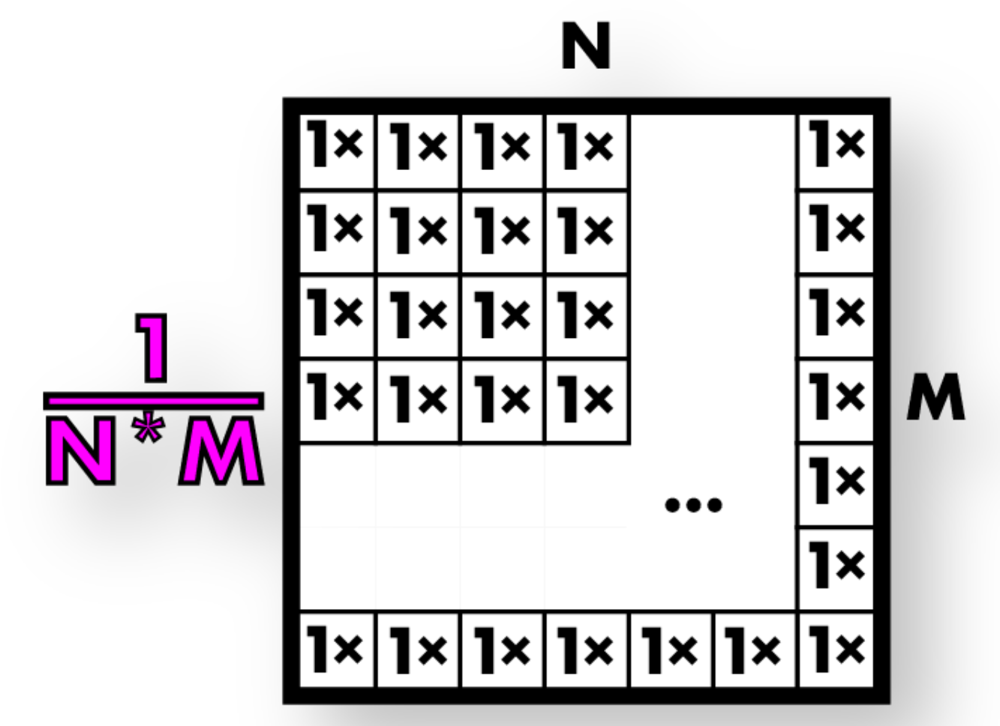

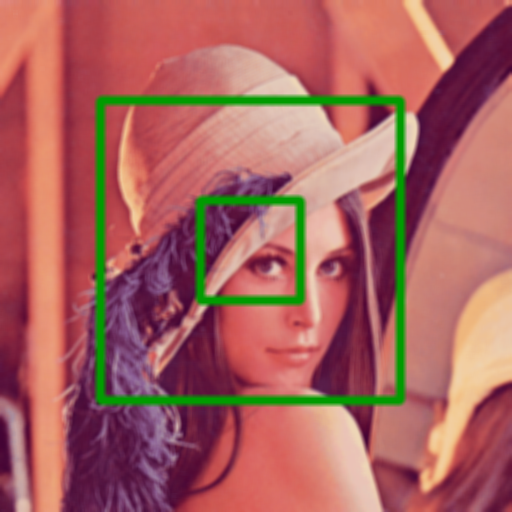

In [21]:
#Graded Activity 2: Create a 5 x 5 average filter
val = 0.04 # ANS
kernel = np.array([[val] * 5] * 5) # ANS

res_image = cv2.filter2D(img,-1, kernel)
cv2_imshow(res_image)

## **3.3 Implement a Gaussian kernel (15%)**

Gaussian kernel is widely used for image smoothing.Gaussian kernel has the shape of the function ‘Gaussian distribution’ to define the weights inside the kernel, which are used to compute the weighted average of the neighboring points (pixels) in an image. Eeach value in the Gaussian filter is from the zero mean Gaussian distribution. One thing we need to keep in mind is that the kernel size is dependent of standard devidation 𝛔 of Gaussian function:

As a rule of thumb, kernel size = `2. ceil(3𝛔)+1`

99% of the probability mass for a gaussian is within +/- 3 standard deviations so make the kernel be 6 times the size of sigma. But also we want an odd number, so make it be the next highest odd integer from 6 x sigma.

Implement `gaussian_kernel(sigma)` which will take a standard deviation value and return a filter that smooths using a gaussian with that sigma. What should be the size of the filter?  


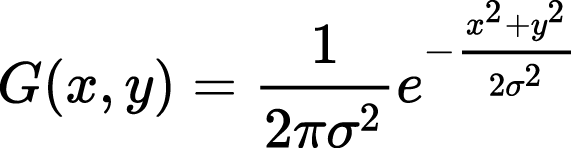

We need to fill in our kernel with some values. Use the probability density function for a 2d gaussian:

In [22]:
#Graded activity: 3

def gaussian_kernel(sigma):
    # Calculate the size of the filter based on the standard deviation (sigma).
    # The filter size is chosen to be large enough to capture the significant values of the Gaussian function.
    # A common choice is to use 6 * sigma, ensuring that the kernel covers most of the Gaussian distribution.
    filter_size = int(6 * sigma) + 1 if (int(6 * sigma) % 2 == 0) else int(6 * sigma) # Ensure the size is odd for symmetry. # ANS

    # Initialize a 2D array (kernel) filled with zeros. This will hold the Gaussian values.
    gaussian_kernel = np.zeros((filter_size, filter_size)) # ANS

    # Calculate the center of the kernel.
    m = filter_size // 2  # Half the filter size in the x-direction.
    n = filter_size // 2  # Half the filter size in the y-direction.

    # Iterate over each position in the kernel to calculate the Gaussian value.
    for x in range(-m, m + 1):  # Loop over the x-axis
        for y in range(-n, n + 1):  # Loop over the y-axis
            # Calculate the normalization factor for the Gaussian function.
            x1 = 1 / (2 * np.pi * sigma ** 2) # ANS

            # Calculate the exponent term of the Gaussian function.
            x2 = np.exp(-((x ** 2 + y ** 2) / (sigma ** 2))) # ANS

            # Assign the computed Gaussian value to the corresponding position in the kernel.
            gaussian_kernel[x + m, y + n] = (1 / x1) * x2  # Normalize the value.

    # Return the generated Gaussian kernel.
    return gaussian_kernel


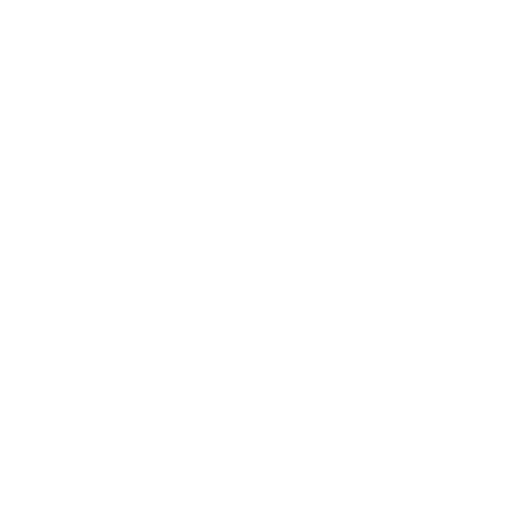

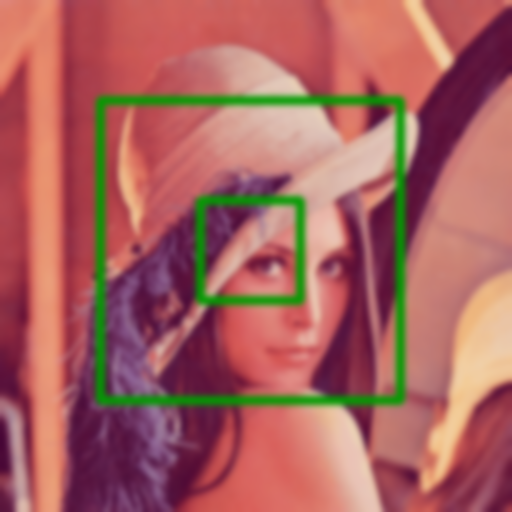

In [23]:
kernel = gaussian_kernel(sigma=3)
gauss_img = cv2.filter2D(img,-1, kernel)
cv2_imshow(gauss_img)


gaussian_blur = cv2.GaussianBlur(src=img, ksize=(25,25), sigmaX=3, sigmaY=3)
cv2_imshow(gaussian_blur)

## **3.4 Other Filters**
Few other filters (sharpening, embossing, median etc.) for you to try.

**Sharpening** You may use a 3 x 3 filter for sharpening. A sharpening filter can also be implemented by the following steps: Take a smoothed image, subtracts it from the original image to obtain the "details" of the image, and then adds the "details" to the original image.

In [24]:

## Sharpening
kernel = np.array([
  [0, -1, 0],
  [-1, 5, -1],
  [0, -1, 0]
])
sharpened_img = cv2.filter2D(img,-1, kernel)
cv2_imshow(sharpened_img)

#Emboss
kernel = np.array([
  [-2, -1, 0],
  [-1, 1, 1],
  [0, 1, 2]
])
emb_image = cv2.filter2D(img,-1, kernel)
cv2_imshow(emb_image)

gauss_noise_img = random_noise(img, mode='gaussian', mean=0, var=0.01, clip=True)
# Convert the noisy image to uint8 format for display
gauss_noise_img_uint8 = (gauss_noise_img * 255).astype(np.uint8)

# Display the noisy image
cv2_imshow(gauss_noise_img_uint8)

sp_noise_img = random_noise(img, mode='s&p', amount=0.11)
# Convert the noisy image to uint8 format for display
sp_noise_img_uint8 = (sp_noise_img * 255).astype(np.uint8)

# Display the noisy image
cv2_imshow(sp_noise_img_uint8)

#sp=cv2.convertScaleAbs(sp_noise_img, alpha = (255/1))
#cv2_imshow(sp)

median=cv2.medianBlur(sp_noise_img_uint8, 5)
cv2_imshow( median)



Output hidden; open in https://colab.research.google.com to view.

##**3.5 Non-linear Filters (10%)**
A non-linear filtering is one that cannot be done with convolution. A sliding median filter is a simple example of a non-linear filter.

**Median Filter** Median Filter is one of Non-linear filters, which is also used for smoothing. Its basic idea is to replace each pixel by the median of its neigboring pixels (pixels in the window). Median filter works well with noisy images.

 In the following code, we generate synthetic noise (gaussian, salt & pepper) using the `random_noise` function from skimage. Then we apply median filter as well as gaussian filters to see the difference.

 Your task is to generate a grid image of gaussian and median filtered images with kernel sizes 3, 5 and 7. Observe the differences.

In [ ]:
#Graded activity: 4

from skimage.util import random_noise

#Generate salt & pepper noise

sp_noise_img = random_noise(img, mode='s&p', amount=0.11)

sp=cv2.convertScaleAbs(sp_noise_img, alpha = (255/1))

# create median filtered images, ANS

median3 = cv2.medianBlur(sp, 3)
median5 = cv2.medianBlur(sp, 5)
median7 = cv2.medianBlur(sp, 7)

# create gaussian filtered images, ANS


gauss3 = cv2.GaussianBlur(sp, ksize=(3,3), sigmaX=3, sigmaY=3)
gauss5 = cv2.GaussianBlur(sp, ksize=(5,5), sigmaX=3, sigmaY=3)
gauss7 = cv2.GaussianBlur(sp, ksize=(7,7), sigmaX=3, sigmaY=3)

img_list=[median3, median5, median7, gauss3, gauss5, gauss7]
grid_image(img_list, 3)


# **4. Hybrid Images (20%)**

Gaussian filters are cool because they are a true low-pass filter for the image. This means when we run them on an image we only get the low-frequency changes in an image like color. Conversely, we can subtract this low-frequency information from the original image to get the high frequency information!

 We can also make really interesting images that look different depending on if you are close or far away from them. That's what we'll be doing. They are hybrid images that take low frequency information from one image and high frequency info from another, i.e., a hybrid image is the sum of a low-pass filtered version of the one image and a high-pass filtered version of a second image.

 In the code below, you can read two images, an image of a cat and an image of a dog and try to create a hybrid image of them. Use Gaussian filter for setting up a simplified version of the hybrid image. Guassian filter will give us the low frequency signals from one image. To get the high frequency signals from the second, you can subtract its low frequency compoenents from the original image.

 Once the hybrid image is created, you can downsample (resize) the images to various resolution to create the effect of viewing from far.


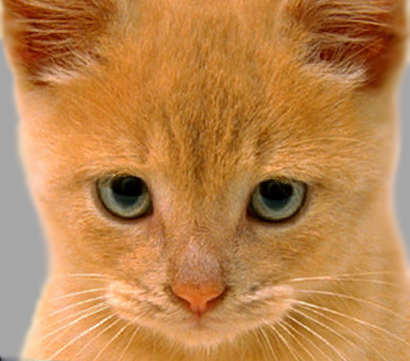

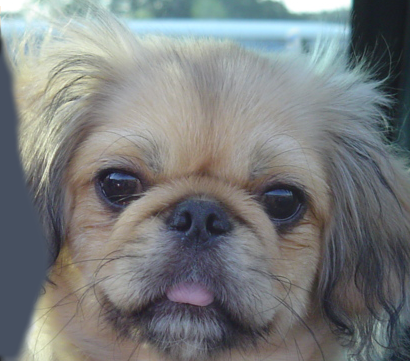

Creating hybrid image...


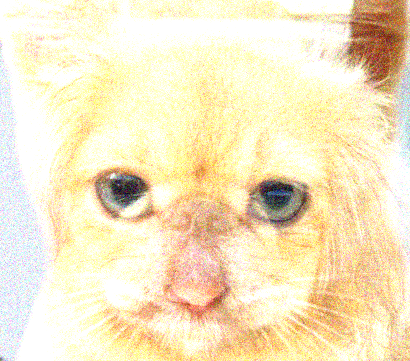

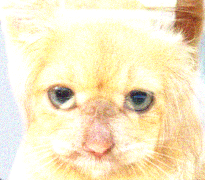

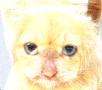

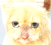

In [ ]:
#Graded activity: 5

#Exercise-Construct hybrid images
import cv2
import numpy as np
from google.colab.patches import cv2_imshow  # If you're using Google Colab

# Read the images
cat = cv2.imread("./data/cat.bmp")
dog = cv2.imread("./data/dog.bmp")

# Display the original images
cv2_imshow(cat)
cv2_imshow(dog)

print("Creating hybrid image...")

# Extract low frequency from image 1 (Gaussian blur)
low = cv2.GaussianBlur(cat, ksize=(3,3), sigmaX=3, sigmaY=3) # ANS

# Extract high frequency from image 2 (Image - Gaussian)
noise_img = random_noise(dog, mode='gaussian', mean=0, var=0.01, clip=True) # ANS
high = (noise_img * 255).astype(np.uint8)

# Combine low and high frequencies
hybrid = cv2.add(low, high) # ANS

# Clip the values to the valid range and convert back to uint8
hybrid = np.clip(hybrid, 0, 255).astype(np.uint8)

# Display the hybrid image
cv2_imshow(hybrid)

# Gaussian Pyramid Construction
hybrid1 = cv2.resize(hybrid, None, fx=0.5, fy=0.5, interpolation=cv2.INTER_LINEAR)
cv2_imshow(hybrid1)

hybrid2 = cv2.resize(hybrid1, None, fx=0.5, fy=0.5, interpolation=cv2.INTER_LINEAR)
cv2_imshow(hybrid2)

hybrid3 = cv2.resize(hybrid2, None, fx=0.5, fy=0.5, interpolation=cv2.INTER_LINEAR)
cv2_imshow(hybrid3)

#**5. Edge Features (15%)**

Next, you familiarize yourself with the Sobel operators that we discussed in the lecture. OpenCV provides function [Sobel()](https://docs.opencv.org/3.4/d4/d86/group__imgproc__filter.html#gacea54f142e81b6758cb6f375ce782c8d) to calculate the derivatives from an image. The syntax follows.

`dst = cv.Sobel(src, ddepth, dx, dy, ksize, scale, delta, borderType)`

Parameters:



*  **src**	input image.
*   **dst**	output image of the same size and the same number of channels as src .
* **ddepth**	output image depth, see [combinations](https://docs.opencv.org/3.4/d4/d86/group__imgproc__filter.html#filter_depths); in the case of 8-bit input images it will result in truncated derivatives.
* **dx**	order of the derivative x (vertical edges).
*  **dy**  	order of the derivative y (hrizontal edges).
* **ksize**	size of the extended Sobel kernel; it must be 1, 3, 5, or 7.
* **scale**	[optional] scale factor for the computed derivative values; by default, no scaling is applied (see getDerivKernels for details).
* **delta**	[optional] delta value that is added to the results prior to storing them in dst.
* **borderType**	pixel extrapolation method, see BorderTypes. BORDER_WRAP is not supported.


In the following code, we load the `lenna` image, convert it to a gray scale image for ease of computation (need to handle only one channel), and smooths that image using the Gaussian kernel. Then we apply the sobel() function on the `lenna` image to get the vertical and horizontal derivatives. Further, we use a weighted combination of these derivatives values as the final image gradients.

Your task is to compute the gradient magnitude and oprientations and display the corresponding images. To compute the actual image gradients and orientations, you can use the gradiant magnitude formula from the lecture slide.




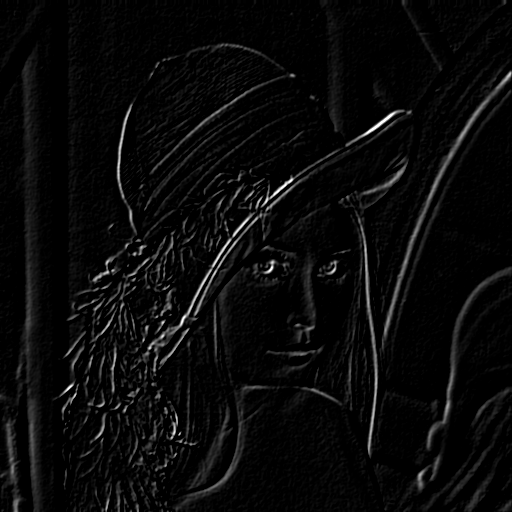

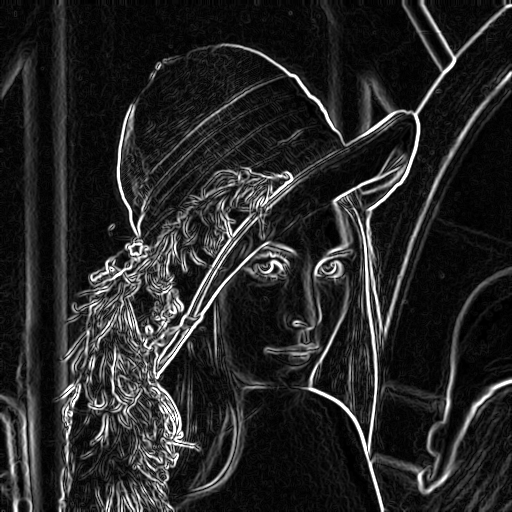

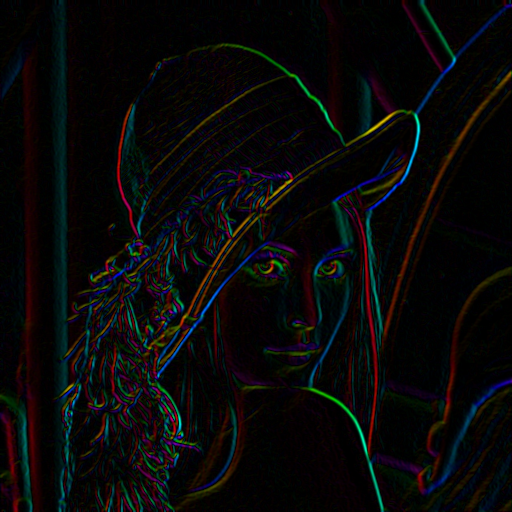

In [ ]:
#Graded Activity 6

import cv2 as cv
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import numpy as np
from skimage import io, filters, feature

#Read the image
lenna = cv.imread("./data/lenna.bmp", 1)

#Convert it to a gray scale aimge
gray = cv.cvtColor(lenna, cv.COLOR_BGR2GRAY)

#Remove noise
gray_smooth = cv.GaussianBlur(gray, (3, 3), 0)

#Sobel Operator (horizontal)
grad_x = cv.Sobel(gray_smooth, cv.CV_32F, 1, 0, ksize=3, borderType=cv.BORDER_DEFAULT)

#Sobel Operator (vertical)
grad_y = cv.Sobel(gray_smooth, cv.CV_32F, 0, 1, ksize=3, borderType=cv.BORDER_DEFAULT)

#Convert to uint8
abs_grad_x = grad_x # Removed cv.convertScaleAbs() since it was converting to 8-bit
abs_grad_y = grad_y

grad = cv.addWeighted(abs_grad_x, 0.5, abs_grad_y, 0.5, 0)

cv2_imshow(grad)

# Compute magnitude and orientations

#compute the squares, cv.multiply()
sobelx2 = cv.multiply(abs_grad_x, abs_grad_x) # ANS
sobely2 = cv.multiply(abs_grad_y, abs_grad_y) # ANS

#compute the square root of the sum, check cv.sqrt()
magnitude = cv.sqrt(sobelx2 + sobely2) # ANS
cv2_imshow(magnitude)

#compute the orientation, you may use cv.phase()
orientation = cv.phase(grad_x, grad_y, angleInDegrees=True) # ANS

orientation = orientation / 2.
hsv = np.zeros_like(lenna)
 # H (in OpenCV between 0:180)
hsv[..., 0] = orientation
# S
hsv[..., 1] = 255
# V 0:255
hsv[..., 2] = cv.normalize(magnitude, None, 0, 255, cv.NORM_MINMAX)

bgr = cv.cvtColor(hsv, cv.COLOR_HSV2BGR)
cv2_imshow(bgr)


Next task for you is to try different gradient operators available in OpenCV. Try Prewitt, Roberts and Canny edge detectors on smu image. Ry varying the hysteresis thresholds of Canny detector and analyze the results.

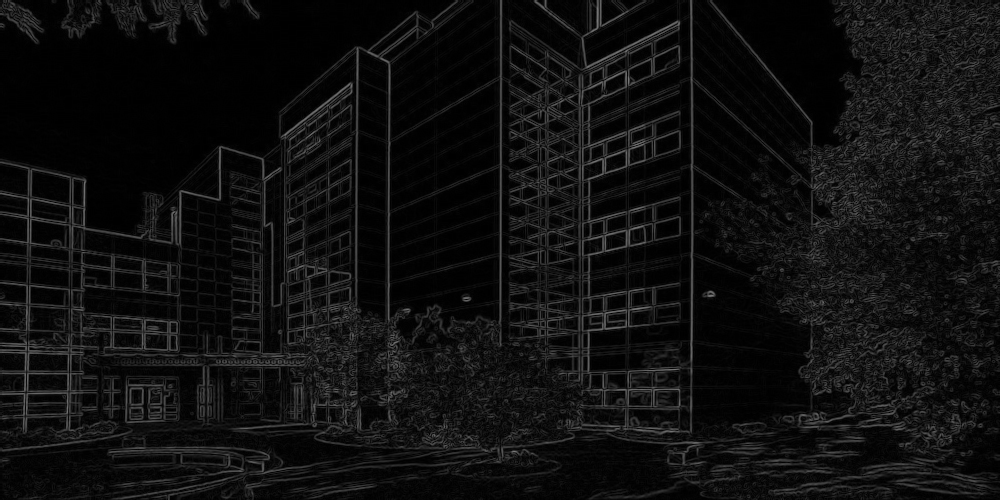

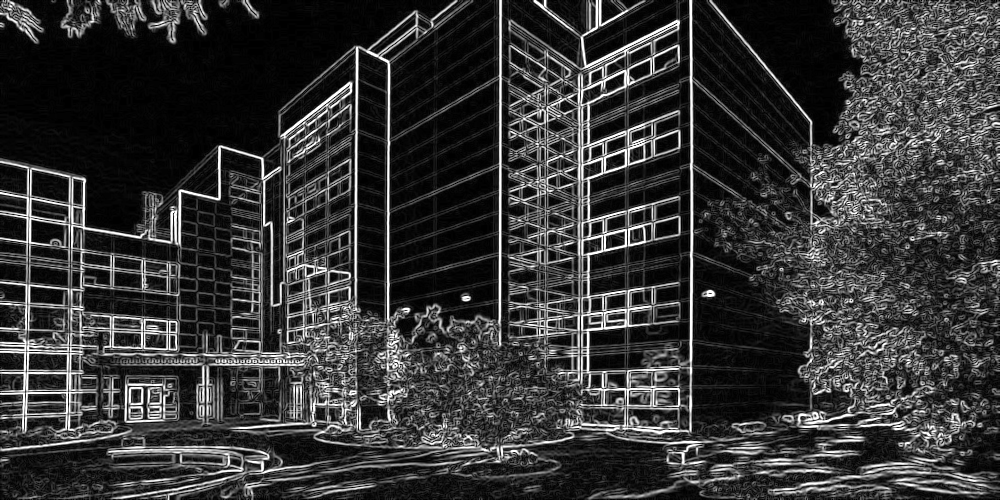

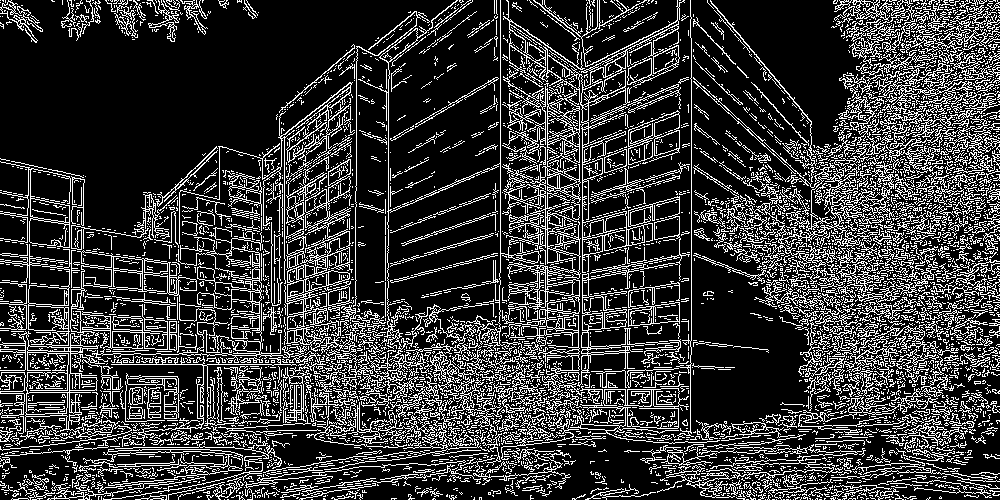

In [ ]:
#Graded Activity 7
smu = cv.imread("./data/smu.jpg", 1)
gray= cv.cvtColor(smu, cv.COLOR_BGR2GRAY)

smu_gray = cv.GaussianBlur(gray, (3, 3), 0)

#Roberts kernel, refer to slides for the v and h kernels
roberts_v = np.array( [[0,1],[-1,0]] ) # ANS
roberts_h = np.array( [[1,0], [0,-1]] ) # ANS

r_grad_x = cv.filter2D(smu_gray, cv.CV_32F, roberts_v)
r_grad_y = cv.filter2D(smu_gray, cv.CV_32F, roberts_h)

robertsx2 = cv.multiply(r_grad_x, r_grad_x) # ANS
robertsy2 = cv.multiply(r_grad_y, r_grad_y) # ANS
r_magnitude = cv.sqrt(robertsx2 + robertsy2)

cv2_imshow(r_magnitude)

#Prewitt kernels, see the lecture slides
p_kernelx = np.array( [[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]] ) # ANS
p_kernely = np.array( [[-1, -1, -1], [0, 0, 0], [1, 1, 1]] ) # ANS

p_grad_x = cv.filter2D(smu_gray, cv.CV_32F, p_kernelx)
p_grad_y = cv.filter2D(smu_gray, cv.CV_32F, p_kernely)

prewittx2 = cv.multiply(p_grad_x, p_grad_x) # ANS
prewitty2 = cv.multiply(p_grad_y, p_grad_y) # ANS
p_magnitude = cv.sqrt(prewittx2 + prewitty2)

cv2_imshow(p_magnitude)


#Canny edge detector, see cv.Canny()
smu_canny = cv.Canny(smu, 80, 150)
cv2_imshow(smu_canny)


# **6. References**

1. https://courses.cs.washington.edu/courses/cse576/20sp/ (Homework problems)
2. Hybrid Images, Olivia et al., http://olivalab.mit.edu/hybridimage.htm
3. https://docs.opencv.org/3.4/d9/df8/tutorial_root.html
